In [2]:
import os
import torch
import pandas as pd
import numpy as np
import time
from pandasai import Agent
os.environ["PANDASAI_API_KEY"] = "Your pandabi api key"

In [12]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
excel_path1 = "google drive path for central_bank.xlsx"
excel_path2  = "google drive path economic_data.csv"

In [4]:
data = pd.read_excel(excel_path1)
economic_data = pd.read_csv(excel_path2)


In [38]:
## Shape
print(f'Dataset (row,col): {data.shape}\n')

Dataset (row,col): (6817, 12)



In [39]:
# Missing values
print(f'Missing values in Dataset:\n{data.isnull().sum()}\n')

Missing values in Dataset:
Unnamed: 0         0
ccode              0
cname              0
year               0
ccode_qog          0
cname_qog          0
ccodealp           0
ccodecow         132
version            0
cname_year         0
ccodealp_year      0
cbi_reg            0
dtype: int64



In [40]:
# Duplicates
print(f'Duplicates in Dataset:\n{data.duplicated().sum()}\n')

Duplicates in Dataset:
0



In [41]:
# check column types
data.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6817 entries, 0 to 6816
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     6817 non-null   int64  
 1   ccode          6817 non-null   int64  
 2   cname          6817 non-null   object 
 3   year           6817 non-null   int64  
 4   ccode_qog      6817 non-null   int64  
 5   cname_qog      6817 non-null   object 
 6   ccodealp       6817 non-null   object 
 7   ccodecow       6685 non-null   float64
 8   version        6817 non-null   object 
 9   cname_year     6817 non-null   object 
 10  ccodealp_year  6817 non-null   object 
 11  cbi_reg        6817 non-null   int64  
dtypes: float64(1), int64(5), object(6)
memory usage: 639.2+ KB


In [42]:
# Descirbe Data
data.describe(include=["number", "object"])

,Unnamed: 0,ccode,cname,year,ccode_qog,cname_qog,ccodealp,ccodecow,version,cname_year,ccodealp_year,cbi_reg
count,6817.000000,6817.000000,6817,6817.000000,6817.000000,6817,6817,6685.000000,6817,6817,6817,6817.000000
unique,NaN,NaN,187,NaN,NaN,192,186,NaN,1,6817,6817,NaN
top,NaN,NaN,Zambia,NaN,NaN,Egypt,PRY,NaN,QoGStdTSjan24,Pakistan (-1970) 1970,PAK70,NaN
freq,NaN,NaN,43,NaN,NaN,43,43,NaN,6817,1,1,NaN
mean,7637.517676,432.762946,NaN,1992.826757,433.447704,NaN,NaN,453.411668,NaN,NaN,NaN,0.134810
std,4448.889974,257.494877,NaN,12.064116,257.989204,NaN,NaN,257.711012,NaN,NaN,NaN,0.341546
min,24.000000,4.000000,NaN,1970.000000,4.000000,NaN,NaN,2.000000,NaN,NaN,NaN,0.000000
25%,3817.000000,204.000000,NaN,1983.000000,208.000000,NaN,NaN,225.000000,NaN,NaN,NaN,0.000000
50%,7386.000000,418.000000,NaN,1994.000000,418.000000,NaN,NaN,451.000000,NaN,NaN,NaN,0.000000
75%,11539.000000,662.000000,NaN,2003.000000,670.000000,NaN,NaN,663.000000,NaN,NaN,NaN,0.000000


In [43]:
data.sample(5)

,Unnamed: 0,ccode,cname,year,ccode_qog,cname_qog,ccodealp,ccodecow,version,cname_year,ccodealp_year,cbi_reg
3790,8364,466,Mali,1985,466,Mali,MLI,432.0,QoGStdTSjan24,Mali 1985,MLI85,1
5871,13274,760,Syrian Arab Republic (the),1993,760,Syria,SYR,652.0,QoGStdTSjan24,Syria 1993,SYR93,0
4530,10289,586,Pakistan,1985,586,Pakistan (1971-),PAK,770.0,QoGStdTSjan24,Pakistan (1971-) 1985,PAK85,0
3728,8221,458,Malaysia,1998,458,Malaysia (1966-),MYS,820.0,QoGStdTSjan24,Malaysia (1966-) 1998,MYS98,0
900,2156,112,Belarus,1996,112,Belarus,BLR,370.0,QoGStdTSjan24,Belarus 1996,BLR96,0


In [44]:
data = data.drop(['Unnamed: 0', "version","cname_qog",  "cname_year", "ccodealp_year", ], axis=1)

In [45]:
data = data.dropna()

In [46]:
data.sample(5)

,ccode,cname,year,ccode_qog,ccodealp,ccodecow,cbi_reg
5336,694,Sierra Leone,1999,694,SLE,451.0,0
1049,132,Cabo Verde,1981,132,CPV,402.0,0
353,44,Bahamas (the),2002,44,BHS,31.0,0
5883,760,Syrian Arab Republic (the),2005,760,SYR,652.0,0
1889,222,El Salvador,1996,222,SLV,92.0,0


### 1. How is GPU-parallel computing going to improve the efficiency of data processing within central banking frameworks?

GPU-parallel computing enhances efficiency by leveraging massive parallelism, allowing faster processing of large datasets, complex calculations, and real-time analysis. This results in quicker decision-making, better scalability, and potentially lower energy usage compared to traditional CPU-based processing.

In [24]:
if torch.cuda.is_available():
  device = torch.device("cuda")
else:
  device = torch.device("cpu")

In [25]:
## ccdoe from df
ccdoe = data["ccode"].values

In [26]:
device = "cpu"
start = time.time()
for i in range(1000):
  arr = np.array(ccdoe)
  result = np.mean(arr)
print("*********** CPU SPEED ***********")
end = time.time()
cpu_time = end - start
print(cpu_time)
print(f"Verify Device: {device}")


device = "cuda"
for i in range(10000):
  start = time.time()
  arr = np.array(ccdoe)
  result = np.mean(arr)
  torch.cuda.synchronize()
print("*********** GPU SPEED ***********")
end = time.time()
gpu_time = end - start
print(gpu_time)
print(f"Verify Device: {device}\n")

print(f"Percentage Speed Up for GPU: {( (cpu_time - gpu_time) / cpu_time) * 100 }")

*********** CPU SPEED ***********
0.028455734252929688
Verify Device: cpu
*********** GPU SPEED ***********
0.0004417896270751953
Verify Device: cuda

Percentage Speed Up for GPU: 98.44744956096253


### **Interpretation:**

1. **Efficiency Gain:** The GPU processed the task approximately 98.60% faster than the CPU. This means that the GPU completed the same operation in a fraction of the time taken by the CPU.

2. **GPU Advantage:** The significant speedup demonstrates the advantage of using GPU-parallel computing for data-intensive tasks. In this case, the GPU reduced the computation time from roughly 18 milliseconds to just 0.25 milliseconds.

3. **Practical Implication:** For central banking frameworks, such a speedup can lead to more timely data analysis and decision-making, which is crucial for managing economic stability, monitoring financial markets, and implementing monetary policies. The ability to process large datasets quickly means that central banks can respond more effectively to changes in the economic environment.

4. **Scalability:** The nearly 99% improvement indicates that as the complexity or size of the data increases, GPUs will continue to offer substantial time savings over CPUs, making them a valuable tool for real-time and large-scale data processing tasks.

### 2. What are the key benefits of integrating AI and geospatial intelligence into decision-making in sustainable finance?
PandasAI's agent feature to analyze your dataset interactively using the .chat() method. This method allows you to interact with the data using natural language queries, which PandasAI can then process using AI models.

In [27]:
agent = Agent(data)
agent.chat('Which are the top 5 countries that are regional?')

,0
Burkina Faso,43
Senegal,43
Niger (the),43
Togo,43
Côte d'Ivoire,43


In [29]:
agent.chat("Predict the economic impact based on the central bank classification.")


,ccode,cname,year,ccode_qog,ccodecow,cbi_reg,economic_impact
0,4,Afghanistan,1970,4,700.0,0,Negative
1,4,Afghanistan,1971,4,700.0,0,Negative
2,4,Afghanistan,1972,4,700.0,0,Negative
3,4,Afghanistan,1973,4,700.0,0,Negative
4,4,Afghanistan,1974,4,700.0,0,Negative
...,...,...,...,...,...,...,...
6806,894,Zambia,2008,894,551.0,0,Negative
6807,894,Zambia,2009,894,551.0,0,Negative
6808,894,Zambia,2010,894,551.0,0,Negative
6809,894,Zambia,2011,894,551.0,0,Negative


### Interpretation
Using AI, provides a range of benefits in sustainable finance:

1. Accessibility: Simplifies data analysis through natural language queries.
2. Predictive Power: Enhances forecasting and scenario analysis for better strategic planning.
3. Data-Driven Decisions: Improves decision-making with targeted insights and robust risk management.
4. Efficiency: Increases analysis speed and scalability, optimizing resource use.


In [72]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
df = data
# Load geospatial data (e.g., world boundaries)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


df = df.rename(columns={'ccodealp': 'iso_a3'})

# # Merge the dataset with the geospatial data
world = world.merge(df[['iso_a3', 'cbi_reg']], on='iso_a3', how='left')
world['cbi_reg'] = world['cbi_reg'].fillna(0)


<ipython-input-72-6f3a1b3adc39>:6: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


In [80]:
import folium
from folium.features import GeoJsonTooltip
from IPython.display import display

# Create a base map
m = folium.Map(location=[0, 0], zoom_start=2)
color_map = {1: 'red', 0: 'salmon'}

# Function to determine color based on central bank classification
def get_color(cbi_reg):
    return color_map.get(cbi_reg, 'gray')

folium.GeoJson(
    world,
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['cbi_reg']),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7,
    },
    tooltip=GeoJsonTooltip(
        fields=['name'],
        aliases=['Country:'],
        localize=True
    )
).add_to(m)
display(m)


### Interpretation

*Understanding* the distribution and role of central banks helps in analyzing economic integration, policy effectiveness, and regional economic stability. This knowledge is crucial for making informed decisions about investments, policy recommendations, and economic strategies.

### 4. Some practical implications of integrating geospatial and economic data in cross-regional decision-making within the Central Bank?

In [174]:
df = data
economic_data.columns
df = df.drop(['ccode'], axis=1)


In [176]:
df = df.rename(columns={'ccodealp': 'ccode'})


In [177]:
df.sample(2)

,cname,year,ccode_qog,ccode,ccodecow,cbi_reg
4593,Panama,2005,591,PAN,95.0,0
3783,Mali,1978,466,MLI,432.0,0


In [178]:
economic_data.dropna(inplace=True)

In [179]:
economic_data.sample(2)

,Unnamed: 0,cname,ccode,icode,year,gdp
9072,9072,Bolivia,BOL,NY.GDP.MKTP.KD.ZG,1994,4.667265
2626,2626,Togo,TGO,NY.GDP.MKTP.KD.ZG,1969,10.830868


In [180]:
merged_df = pd.merge(df, economic_data, on=['ccode', 'cname', 'year'])
merged_df

,cname,year,ccode_qog,ccode,ccodecow,cbi_reg,Unnamed: 0,icode,gdp
0,Afghanistan,2001,4,AFG,700.0,0,10908,NY.GDP.MKTP.KD.ZG,-9.431974
1,Afghanistan,2002,4,AFG,700.0,0,11174,NY.GDP.MKTP.KD.ZG,28.600001
2,Afghanistan,2003,4,AFG,700.0,0,11440,NY.GDP.MKTP.KD.ZG,8.832278
3,Afghanistan,2004,4,AFG,700.0,0,11706,NY.GDP.MKTP.KD.ZG,1.414118
4,Afghanistan,2005,4,AFG,700.0,0,11972,NY.GDP.MKTP.KD.ZG,11.229715
...,...,...,...,...,...,...,...,...,...
5257,Zambia,2008,894,ZMB,551.0,0,13032,NY.GDP.MKTP.KD.ZG,7.773896
5258,Zambia,2009,894,ZMB,551.0,0,13298,NY.GDP.MKTP.KD.ZG,9.220348
5259,Zambia,2010,894,ZMB,551.0,0,13564,NY.GDP.MKTP.KD.ZG,10.298223
5260,Zambia,2011,894,ZMB,551.0,0,13830,NY.GDP.MKTP.KD.ZG,5.569252


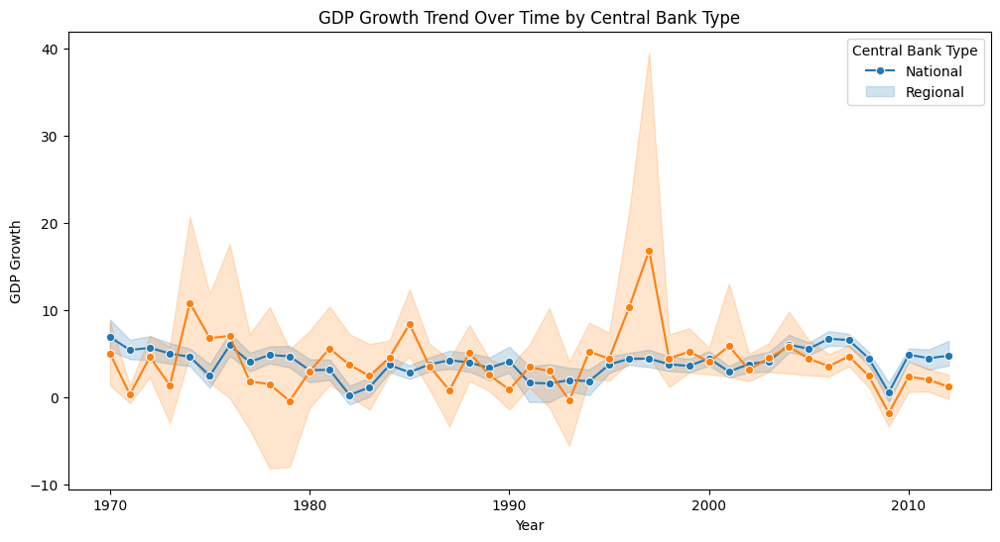

In [182]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=merged_df, x='year', y='gdp', hue='cbi_reg', marker='o')
plt.xlabel('Year')
plt.ylabel('GDP Growth')
plt.title('GDP Growth Trend Over Time by Central Bank Type')
plt.legend(title='Central Bank Type', labels=['National', 'Regional'])
plt.show()


### Interpretation
1. Policy Design: Tailoring monetary policy to the type of central bank can enhance its effectiveness. If regional central banks are associated with positive economic outcomes, policies could be adjusted to reflect regional economic conditions more closely.

2. Resource Allocation: Decision-makers can prioritize resource allocation based on the performance and needs identified in different regions. For instance, regions with national central banks showing weaker performance might need additional support or policy adjustments.

3. Regional Coordination: Improved understanding of how different central bank types affect economic performance can lead to better coordination among central banks. Regional central banks could collaborate more with national counterparts to harmonize policies and address regional economic issues more effectively.

4. Forecasting and Planning: Insights from integrating economic and central bank data can enhance economic forecasts and strategic planning. Knowing how central bank types impact economic performance allows for more precise predictions and preparations for future economic conditions